In [1]:
import random
import os
import re
import json
import pandas as pd
import lightgbm as lgbm
from datetime import datetime
from time import gmtime, strftime
from scipy import stats
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
import torch
import lightgbm
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.metrics import f1_score, mean_absolute_error, mean_squared_error
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
%matplotlib inline
import matplotlib.pyplot as plt  # Matlab-style plotting
import seaborn as sns
color = sns.color_palette()
sns.set_style('darkgrid')
import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)


from scipy import stats
from scipy.stats import norm, skew #for some statistics
# from gensim.models import KeyedVectors
# from gensim.scripts.glove2word2vec import glove2word2vec
# from PIL import Image
# # from PIL import ImageFile
# # ImageFile.LOAD_TRUNCATED_IMAGES = True
# from transformers import ViltProcessor, ViltModel


random_seed = 2020
random.seed(random_seed)
np.random.seed(random_seed)

/usr/local/lib/python3.8/dist-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [19]:
## 读取数据
all_data = pd.read_csv('../data/feature_data_530.csv')
# glove
# glove_tags = pd.read_csv('../data/alltags_feature.csv')
# glove_title = pd.read_csv('../data/title_feature.csv')
# all_data = pd.concat([all_data, glove_tags, glove_title], axis=1)
# all_data = pd.concat([all_data, glove_tags, glove_title], axis=1)
# columns = ['Category', 'Uid', 'Subcategory','Mediatype', 'Longitude', 'Geoaccuracy', 'Latitude',
#          'Title_len', 'Title_number','Alltags_len','Alltags_number', 'hour', 'day','weekday','week_hour',
#           'year_weekday','photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
#           'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
#           'followingCount']
columns = ['Title_len', 'Title_number', 'Alltags_len', 'Alltags_number', 'photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount','followingCount']
skew_features = all_data[columns].apply(lambda x: skew(x)).sort_values(ascending=False)
high_skew = skew_features[abs(skew_features) > 0.75]
skew_index = high_skew.index
for i in skew_index:
    all_data[i] = np.log1p(all_data[i])

    
train_all_data = all_data[all_data['train_type'] != -1]
submit_all_data = all_data[all_data['train_type'] == -1]

train_all_data = train_all_data.reset_index(drop=True)
submit_all_data = submit_all_data.reset_index(drop=True)

feature_columns = ['Pid', 'train_type', 'label', 'mean_label']
feature_columns += ['user_fe_{}'.format(i) for i in range(399)]
feature_columns += ['loc_fe_{}'.format(i) for i in range(400)]

train_label_df = train_all_data[['Pid', 'label']]
train_feature_df = train_all_data.drop(feature_columns, axis=1)

submit_label_df = submit_all_data[['Pid', 'label']]
submit_feature_df = submit_all_data.drop(feature_columns, axis=1)

print(len(train_feature_df), len(submit_feature_df))
print(len(train_label_df), len(submit_label_df))


305613 180581
305613 180581


In [11]:
columns = ['Category', 'Uid', 'Subcategory','Mediatype', 'Longitude', 'Geoaccuracy', 
         'Title_len', 'Title_number','Alltags_len','Alltags_number', 'hour', 'day','weekday','week_hour',
          'year_weekday','photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          'followingCount']
skew_features = all_data[columns].apply(lambda x: skew(x)).sort_values(ascending=False)
high_skew = skew_features[abs(skew_features) > 0.75]
skew_index = high_skew.index
skew_index

Index(['meanFaves', 'meanTags', 'meanView', 'followingCount', 'totalFaves',
       'photo_count', 'followerCount', 'totalGeotagged', 'totalTags',
       'photoCount', 'totalInGroup', 'Title_len', 'Title_number',
       'Geoaccuracy', 'Alltags_len', 'Alltags_number', 'Mediatype'],
      dtype='object')

In [12]:
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
for i in skew_index:
    print(i)
    all_data[i] = boxcox1p(all_data[i], boxcox_normmax(all_data[i] + 1))

meanFaves
meanTags
meanView
followingCount
totalFaves
photo_count
followerCount
totalGeotagged
totalTags
photoCount
totalInGroup
Title_len
Title_number
Geoaccuracy
Alltags_len
Alltags_number
Mediatype


In [13]:
all_data['Latitude'] = np.log1p(all_data['Latitude'])

/usr/local/lib/python3.8/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [14]:
train_all_data = all_data[all_data['train_type'] != -1]
submit_all_data = all_data[all_data['train_type'] == -1]

train_all_data = train_all_data.reset_index(drop=True)
submit_all_data = submit_all_data.reset_index(drop=True)

feature_columns = ['Pid', 'train_type', 'label', 'mean_label']
feature_columns += ['user_fe_{}'.format(i) for i in range(399)]
feature_columns += ['loc_fe_{}'.format(i) for i in range(400)]

train_label_df = train_all_data[['Pid', 'label']]
train_feature_df = train_all_data.drop(feature_columns, axis=1)

submit_label_df = submit_all_data[['Pid', 'label']]
submit_feature_df = submit_all_data.drop(feature_columns, axis=1)

print(len(train_feature_df), len(submit_feature_df))
print(len(train_label_df), len(submit_label_df))


305613 180581
305613 180581


In [20]:
# list(train_feature_df.columns)

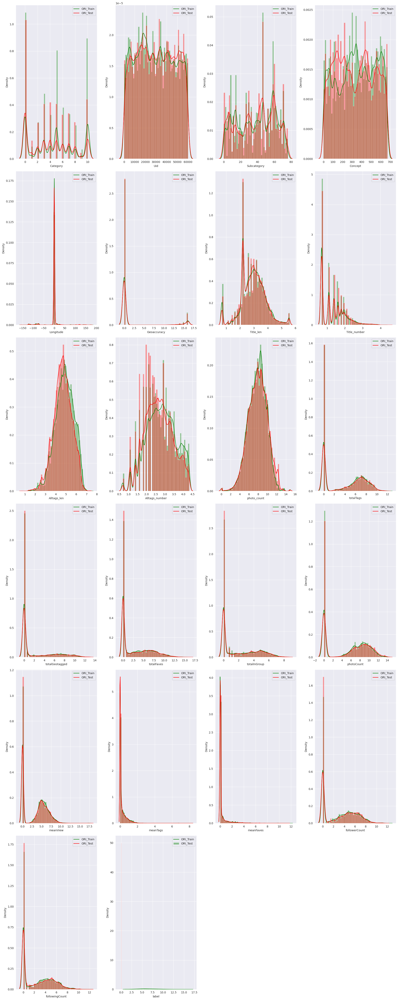

In [5]:
# from scipy.special import boxcox1p
# from scipy.stats import boxcox_normmax
columns = ['Category', 'Uid', 'Subcategory','Concept', 'Longitude', 'Geoaccuracy',  
         'Title_len', 'Title_number','Alltags_len','Alltags_number', 
          'photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          'followingCount', 'label']
train_ori = train_all_data[columns]
test_ori = submit_all_data[columns]
all_ori = all_data[columns]
plt.figure(figsize=(20,50),dpi=100)
for i in range(22):
    plt.subplot(6,4,i+1)
    sns.distplot(train_ori.iloc[:,i], color='green')
    sns.distplot(test_ori.iloc[:,i], color='red')
    plt.legend(['ORI_Train','ORI_Test'])
plt.tight_layout()

In [20]:
## modify the distributions 
from tqdm import trange
ss1 = [ss*0.95 for ss in train_all_data['Alltags_len']]
ss2 = [ss*0.95 for ss in train_all_data['Alltags_number']]
# for ss in train_all_data['Alltags_len']

In [26]:
ss3 = [ss*0.99 for ss in train_all_data['totalTags']]
ss4 = [ss*0.99 for ss in train_all_data['totalFaves']]
ss5 = [ss*0.99 for ss in train_all_data['totalInGroup']]
ss6 = [ss*0.99 for ss in train_all_data['meanView']]
ss7 = [ss*0.99 for ss in train_all_data['meanTags']]
ss8 = [ss*0.99 for ss in train_all_data['meanFaves']]
ss9 = [ss*0.99 for ss in train_all_data['followerCount']]
ss10 = [ss*0.99 for ss in train_all_data['followingCount']]

In [21]:
train_all_data['Alltags_len'] = pd.DataFrame(ss1, columns=['Alltags_len'])
train_all_data['Alltags_number'] = pd.DataFrame(ss2, columns=['Alltags_number'])

In [27]:
train_all_data['totalTags'] = pd.DataFrame(ss3, columns=['totalTags'])
train_all_data['totalFaves'] = pd.DataFrame(ss4, columns=['totalFaves'])
train_all_data['totalInGroup'] = pd.DataFrame(ss5, columns=['totalInGroup'])
train_all_data['meanView'] = pd.DataFrame(ss6, columns=['meanView'])
train_all_data['meanTags'] = pd.DataFrame(ss7, columns=['meanTags'])
train_all_data['meanFaves'] = pd.DataFrame(ss8, columns=['meanFaves'])
train_all_data['followerCount'] = pd.DataFrame(ss9, columns=['followerCount'])
train_all_data['followingCount'] = pd.DataFrame(ss10, columns=['followingCount'])

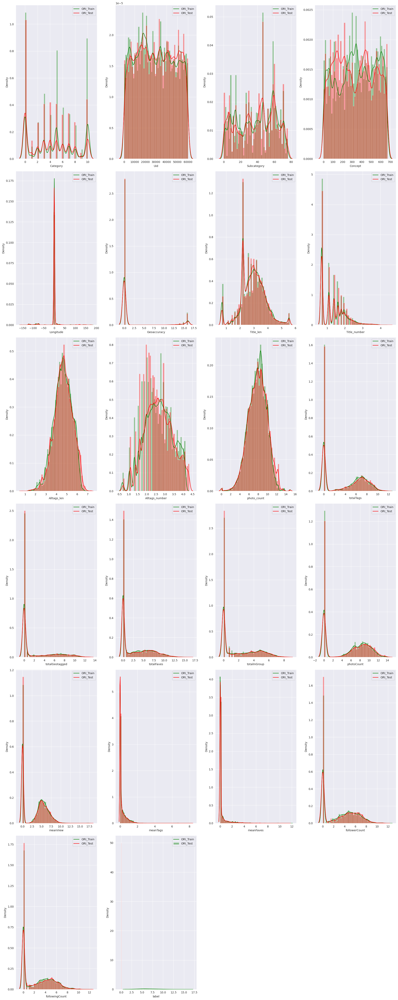

In [28]:
# from scipy.special import boxcox1p
# from scipy.stats import boxcox_normmax
columns = ['Category', 'Uid', 'Subcategory','Concept', 'Longitude', 'Geoaccuracy',  
         'Title_len', 'Title_number','Alltags_len','Alltags_number', 
          'photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          'followingCount', 'label']
train_ori = train_all_data[columns]
test_ori = submit_all_data[columns]
all_ori = all_data[columns]
plt.figure(figsize=(20,50),dpi=100)
for i in range(22):
    plt.subplot(6,4,i+1)
    sns.distplot(train_ori.iloc[:,i], color='green')
    sns.distplot(test_ori.iloc[:,i], color='red')
    plt.legend(['ORI_Train','ORI_Test'])
plt.tight_layout()

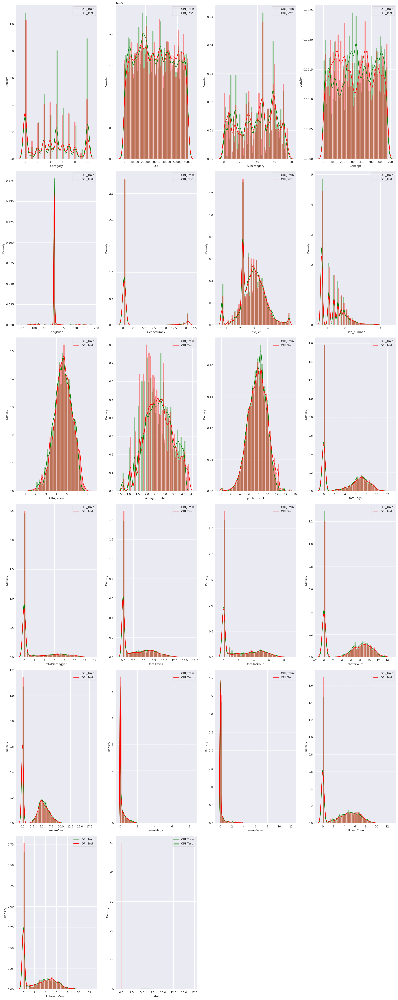

In [22]:
# from scipy.special import boxcox1p
# from scipy.stats import boxcox_normmax
columns = ['Category', 'Uid', 'Subcategory','Concept', 'Longitude', 'Geoaccuracy',  
         'Title_len', 'Title_number','Alltags_len','Alltags_number', 
          'photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          'followingCount', 'label']
train_ori = train_all_data[columns]
test_ori = submit_all_data[columns]
all_ori = all_data[columns]
plt.figure(figsize=(20,50),dpi=100)
for i in range(22):
    plt.subplot(6,4,i+1)
    sns.distplot(train_ori.iloc[:,i], color='green')
    sns.distplot(test_ori.iloc[:,i], color='red')
    plt.legend(['ORI_Train','ORI_Test'])
plt.tight_layout()

In [23]:
all_data['follow'] = (all_data['followingCount'] + 1) / (all_data['followerCount'] + 1)
all_data['tag_faves'] = (all_data['meanFaves'] + 1) / (all_data['meanTags'] + 1)
all_data['group_faves'] = (all_data['totalFaves'] + 1) / (all_data['totalInGroup'] + 1)

305613 180581
305613 180581


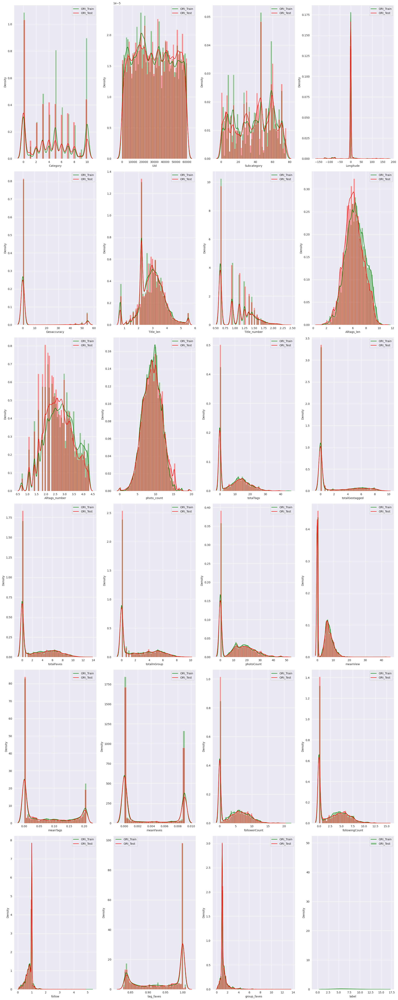

In [25]:
train_all_data = all_data[all_data['train_type'] != -1]
submit_all_data = all_data[all_data['train_type'] == -1]

train_all_data = train_all_data.reset_index(drop=True)
submit_all_data = submit_all_data.reset_index(drop=True)

feature_columns = ['Pid', 'train_type', 'label', 'mean_label']
feature_columns += ['user_fe_{}'.format(i) for i in range(399)]
feature_columns += ['loc_fe_{}'.format(i) for i in range(400)]

train_label_df = train_all_data[['Pid', 'label']]
train_feature_df = train_all_data.drop(feature_columns, axis=1)

submit_label_df = submit_all_data[['Pid', 'label']]
submit_feature_df = submit_all_data.drop(feature_columns, axis=1)

print(len(train_feature_df), len(submit_feature_df))
print(len(train_label_df), len(submit_label_df))
columns_new = ['Category', 'Uid', 'Subcategory', 'Longitude', 'Geoaccuracy',  
         'Title_len', 'Title_number','Alltags_len','Alltags_number', 
          'photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          'followingCount', 'follow', 'tag_faves', 'group_faves', 'label']
train_ori = train_all_data[columns_new]
test_ori = submit_all_data[columns_new]
all_ori = all_data[columns_new]
plt.figure(figsize=(20,50),dpi=100)
for i in range(24):
    plt.subplot(6,4,i+1)
    sns.distplot(train_ori.iloc[:,i], color='green')
    sns.distplot(test_ori.iloc[:,i], color='red')
    plt.legend(['ORI_Train','ORI_Test'])
plt.tight_layout()

In [ ]:
## 对已有特征进行增加
## 1. 增加view-fave转化比等
train_ori['view_Faves'] = (train_ori['meanView'] + 1) / (train_ori['meanFaves'] + 1)
train_ori['view_Follower'] = (train_ori['meanView'] + 1) / (train_ori['followerCount'] + 1)
train_ori['view_Following'] = (train_ori['meanView'] + 1) / (train_ori['followingCount'] + 1)
test_ori['view_Faves'] = (test_ori['meanView'] + 1) / (test_ori['meanFaves'] + 1)
test_ori['view_Follower'] = (test_ori['meanView'] + 1) / (test_ori['followerCount'] + 1)
test_ori['view_Following'] = (test_ori['meanView'] + 1) / (test_ori['followingCount'] + 1)
## 2.加入title与tag的比值
train_ori['title_tag_len'] = (train_ori['Alltags_len'] + 1) / (train_ori['Title_len'] + 1)
train_ori['title_tag_num'] = (train_ori['Alltags_number'] + 1) / (train_ori['Title_number'] + 1)
test_ori['title_tag_len'] = (test_ori['Alltags_len'] + 1) / (test_ori['Title_len'] + 1)
test_ori['title_tag_num'] = (test_ori['Alltags_number'] + 1) / (test_ori['Title_number'] + 1)

In [26]:
## 计算两个分布之间的KS检验值
from scipy import stats
features_list = train_ori.columns.values.tolist()
for feature in features_list:
    statistic, p_value = stats.kstest(train_ori[feature], test_ori[feature])
    print("KS test value: %.3f" %statistic, "with a p-value %.2f" %p_value, "for the feature",feature)

KS test value: 0.099 with a p-value 0.00 for the feature Category
KS test value: 0.020 with a p-value 0.00 for the feature Uid
KS test value: 0.046 with a p-value 0.00 for the feature Subcategory
KS test value: 0.010 with a p-value 0.00 for the feature Longitude
KS test value: 0.009 with a p-value 0.00 for the feature Geoaccuracy
KS test value: 0.011 with a p-value 0.00 for the feature Title_len
KS test value: 0.007 with a p-value 0.00 for the feature Title_number
KS test value: 0.100 with a p-value 0.00 for the feature Alltags_len
KS test value: 0.082 with a p-value 0.00 for the feature Alltags_number
KS test value: 0.038 with a p-value 0.00 for the feature photo_count
KS test value: 0.032 with a p-value 0.00 for the feature totalTags
KS test value: 0.023 with a p-value 0.00 for the feature totalGeotagged
KS test value: 0.033 with a p-value 0.00 for the feature totalFaves
KS test value: 0.029 with a p-value 0.00 for the feature totalInGroup
KS test value: 0.033 with a p-value 0.00 for

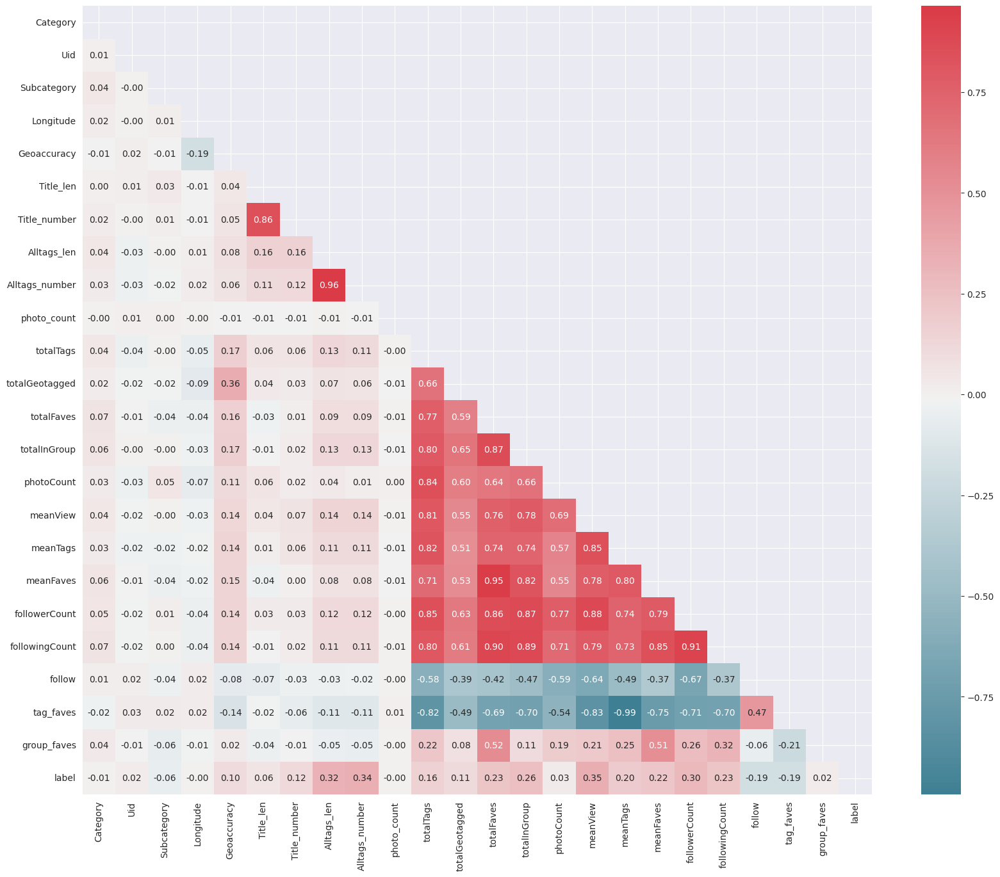

In [27]:
## 画出corr图
# 找出相关程度
plt.figure(figsize=(20, 16))  # 指定绘图对象宽度和高度
colnm = train_ori.columns.tolist()  # 列表头
mcorr = train_ori[colnm].corr(method="spearman")  # 相关系数矩阵，即给出了任意两个变量之间的相关系数
mask = np.zeros_like(mcorr, dtype=np.bool_)  # 构造与mcorr同维数矩阵 为bool型
mask[np.triu_indices_from(mask)] = True  # 角分线右侧为True
cmap = sns.diverging_palette(220, 10, as_cmap=True)  # 返回matplotlib colormap对象
g = sns.heatmap(mcorr, mask=mask, cmap=cmap, square=True, annot=True, fmt='0.2f')  # 热力图（看两两相似度）
plt.show()

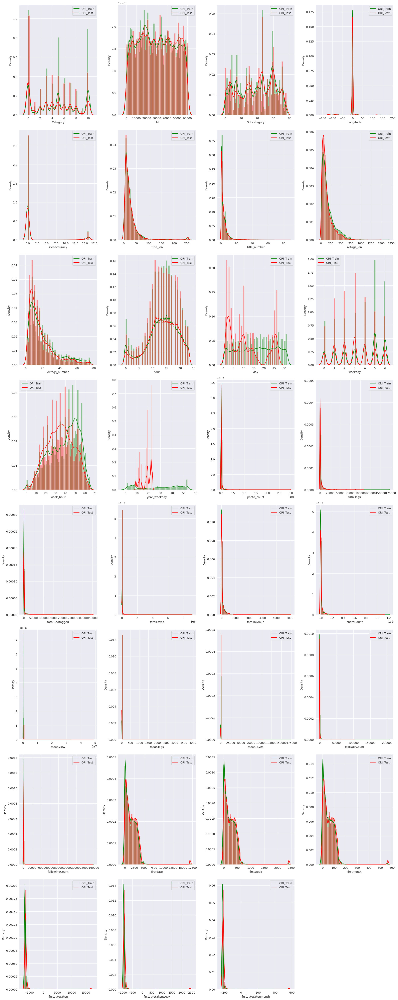

In [26]:
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
columns = ['Category', 'Uid', 'Subcategory', 'Longitude', 'Geoaccuracy',  
         'Title_len', 'Title_number','Alltags_len','Alltags_number', 'hour', 'day','weekday','week_hour',
          'year_weekday','photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          'followingCount', 'firstdate', 'firstweek', 'firstmonth', 'firstdatetaken', 'firstdatetakenweek','firstdatetakenmonth', 'label']
train_ori = train_all_data[columns]
test_ori = submit_all_data[columns]
all_ori = all_data[columns]
plt.figure(figsize=(20,50),dpi=100)
for i in range(31):
    plt.subplot(8,4,i+1)
    sns.distplot(train_ori.iloc[:,i], color='green')
    sns.distplot(test_ori.iloc[:,i], color='red')
    plt.legend(['ORI_Train','ORI_Test'])
plt.tight_layout()

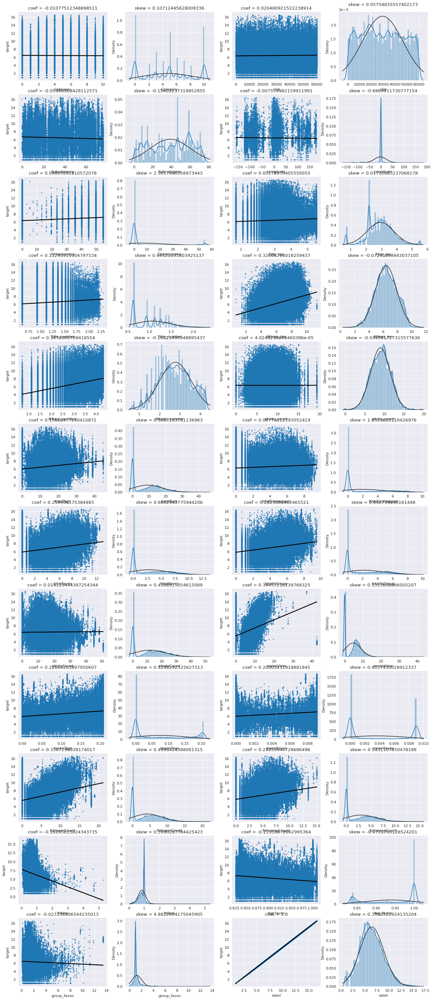

In [29]:
## 看看是否符合正态分布

plt.figure(figsize=(20,60),dpi=80)
i = 0
for col in train_ori.columns:
    i += 1
    plt.subplot(15,4,i)
    sns.regplot(x = col, y = 'label', data = train_ori,
               scatter_kws = {'marker': '.', 's': 5, 'alpha': .6},
               line_kws = {'color': 'k'})
    coef = np.corrcoef(train_ori[col], train_ori['label'])[0][1]
    plt.title(f'coef = {coef}')
    plt.xlabel(col)
    plt.ylabel('target')
    
    i += 1
    plt.subplot(15,4,i)
    sns.distplot(train_ori[col], fit = stats.norm)
    plt.title(f'skew = {stats.skew(train_ori[col])}')
    plt.xlabel(col)
    


In [30]:
## 直接对数据进行z归一化
## 可以归一化的列为：['Longitude', 'Geoaccuracy', 'Title_len', 'Title_number','Alltags_len','Alltags_number', 'totalTags', 'totalGeotagged', 'totalFaves',
          # 'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          # 'followingCount']
normed_columns = ['Longitude', 'Geoaccuracy', 'Title_len', 'Title_number','Alltags_len','Alltags_number', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount','followingCount', 'follow', 'tag_faves', 'group_faves']
all_data[normed_columns] = all_data[normed_columns].apply(lambda x: (x-x.mean())/x.std())
all_data
# dfull.iloc[:,:-1] = dfull.iloc[:,:-1].apply(lambda x: (x-x.mean())/x.std())

,Pid,train_type,Uid,Uid_count,mean_label,Category,Subcategory,Concept,Title_len,Title_number,...,meanView,meanTags,meanFaves,followerCount,followingCount,Ispublic,label,follow,tag_faves,group_faves
0,775,0,21894,4,8.690000,5,65,75,0.663769,0.954957,...,1.875290,1.629935,1.330608,1.673477,2.097425,1,11.18,0.022256,-1.572493,-0.182722
1,1075,0,53866,13,7.525385,0,75,139,1.257230,1.784201,...,1.046947,-0.335266,1.330244,2.304750,1.048107,1,15.15,-1.495741,0.376118,-0.208994
2,4890,0,26948,1,10.990000,3,42,480,-0.441356,-0.348944,...,1.965235,1.654695,1.330608,1.468751,1.784369,1,10.99,-0.064232,-1.593764,3.289036
3,6568,0,355,1,8.630000,10,68,225,-0.005004,0.134632,...,0.403783,-0.396576,1.330608,1.365059,1.702361,1,8.63,-0.024550,0.446526,0.244259
4,7079,0,315,31,8.489677,2,43,317,-0.864349,-1.112186,...,1.982780,1.378313,-0.856414,2.105307,-0.054318,1,11.16,-2.375075,-1.468671,-1.377000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
486189,1118324,-1,46088,2,4.380000,0,35,301,-1.153530,-1.112186,...,1.101301,1.654814,1.330608,0.965644,1.444940,1,0.00,0.241831,-1.593866,0.308771
486190,1118329,-1,12280,7,1.382857,0,60,110,0.355518,0.479745,...,-1.095843,-0.895690,-0.856414,-1.049749,-0.984227,1,0.00,0.633608,0.907663,-0.316267
486191,1118336,-1,43496,9,3.674444,4,28,186,0.906514,1.129585,...,1.398063,1.656492,1.330608,1.118104,0.751814,1,0.00,-0.879287,-1.595305,0.285412
486192,1118349,-1,5492,17,5.671176,7,27,54,-0.202583,0.134632,...,1.602589,1.653762,1.330608,1.310825,1.254370,1,0.00,-0.480910,-1.592964,0.107459


305613 180581
305613 180581


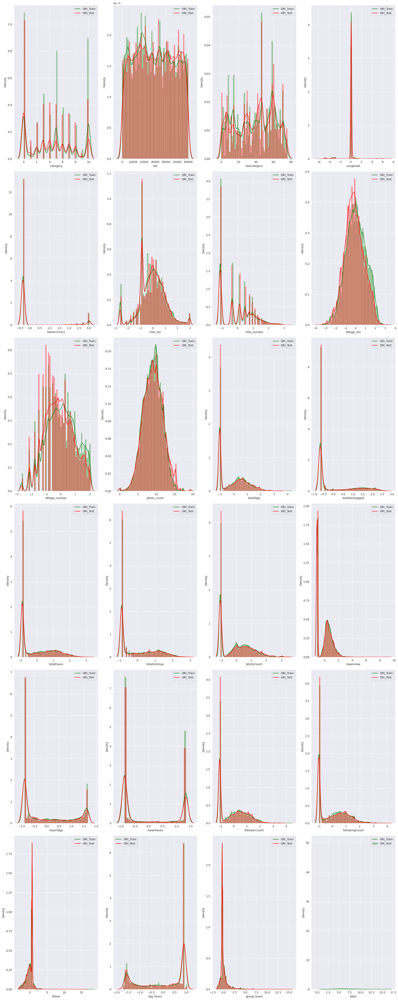

In [32]:
train_all_data = all_data[all_data['train_type'] != -1]
submit_all_data = all_data[all_data['train_type'] == -1]

train_all_data = train_all_data.reset_index(drop=True)
submit_all_data = submit_all_data.reset_index(drop=True)

feature_columns = ['Pid', 'train_type', 'label', 'mean_label']
feature_columns += ['user_fe_{}'.format(i) for i in range(399)]
feature_columns += ['loc_fe_{}'.format(i) for i in range(400)]

train_label_df = train_all_data[['Pid', 'label']]
train_feature_df = train_all_data.drop(feature_columns, axis=1)

submit_label_df = submit_all_data[['Pid', 'label']]
submit_feature_df = submit_all_data.drop(feature_columns, axis=1)

print(len(train_feature_df), len(submit_feature_df))
print(len(train_label_df), len(submit_label_df))
columns_new = ['Category', 'Uid', 'Subcategory', 'Longitude', 'Geoaccuracy',  
         'Title_len', 'Title_number','Alltags_len','Alltags_number', 
          'photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          'followingCount', 'follow', 'tag_faves', 'group_faves', 'label']
train_ori = train_all_data[columns_new]
test_ori = submit_all_data[columns_new]
all_ori = all_data[columns_new]
plt.figure(figsize=(20,50),dpi=100)
for i in range(24):
    plt.subplot(6,4,i+1)
    sns.distplot(train_ori.iloc[:,i], color='green')
    sns.distplot(test_ori.iloc[:,i], color='red')
    plt.legend(['ORI_Train','ORI_Test'])
plt.tight_layout()

In [ ]:
## 从train数据集中随机采取8w条并计算其分布距离


In [33]:
from scipy import stats
features_list = train_ori.columns.values.tolist()
for feature in features_list:
    statistic, p_value = stats.kstest(train_ori[feature], test_ori[feature])
    print("KS test value: %.3f" %statistic, "with a p-value %.2f" %p_value, "for the feature",feature)

KS test value: 0.099 with a p-value 0.00 for the feature Category
KS test value: 0.020 with a p-value 0.00 for the feature Uid
KS test value: 0.046 with a p-value 0.00 for the feature Subcategory
KS test value: 0.010 with a p-value 0.00 for the feature Longitude
KS test value: 0.009 with a p-value 0.00 for the feature Geoaccuracy
KS test value: 0.011 with a p-value 0.00 for the feature Title_len
KS test value: 0.007 with a p-value 0.00 for the feature Title_number
KS test value: 0.100 with a p-value 0.00 for the feature Alltags_len
KS test value: 0.082 with a p-value 0.00 for the feature Alltags_number
KS test value: 0.038 with a p-value 0.00 for the feature photo_count
KS test value: 0.032 with a p-value 0.00 for the feature totalTags
KS test value: 0.023 with a p-value 0.00 for the feature totalGeotagged
KS test value: 0.033 with a p-value 0.00 for the feature totalFaves
KS test value: 0.029 with a p-value 0.00 for the feature totalInGroup
KS test value: 0.033 with a p-value 0.00 for

In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='ticks')
 
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV, learning_curve, RepeatedKFold
 
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV
from sklearn.svm import SVR
from xgboost import XGBRegressor
 
import warnings
warnings.filterwarnings('ignore')

In [39]:
## 创建模型评分模型
from sklearn.metrics import f1_score, mean_absolute_error, mean_squared_error
from scipy import stats
def score(y, y_pred):
    # 计算均方误差 MSE
    print('MSE = {0}'.format(mean_squared_error(y, y_pred)))
    # 计算模型决定系数 R2
    print('R2 = {0}'.format(r2_score(y, y_pred)))
    # 计算模型MAE得分
    print('MAE = {0}'.format(mean_absolute_error(y, y_pred)))
    # 计算模型SRC值
    print('SRC = {0}'.format(stats.spearmanr(y,  y_pred)[0]))
    
    # 计算预测残差，找异常点
    y = pd.Series(y)
    y_pred = pd.Series(y_pred, index=y.index)
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()
    z = (resid - mean_resid) / std_resid
    n_outliers = sum(abs(z)>3)
    
    # 图一：真实值vs预计值
    plt.figure(figsize=(18,5), dpi=80)
    plt.subplot(131)
    plt.plot(y, y_pred, '.')
    plt.xlabel('y')
    plt.ylabel('y_pred')
    plt.title('corr = {:.3f}'.format(np.corrcoef(y,y_pred)[0][1]))
    
    # 图二：残差分布散点图
    plt.subplot(132)
    plt.plot(y, y-y_pred, '.')
    plt.xlabel('y')
    plt.ylabel('resid')
    plt.ylim([-3,3])
    plt.title('std_resid = {:.3f}'.format(std_resid))
    
    # 图三：残差z得分直方图
    plt.subplot(133)
    sns.distplot(z, bins=50)
    plt.xlabel('z')
    plt.title('{:.0f} samples with z>3'.format(n_outliers))
    plt.tight_layout()


In [37]:
X = np.array(train_ori.iloc[:,:-1])
y = np.array(train_ori['label'])
 
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=2023)

best_alpha = 0.1
MSE = 3.932798340796387
R2 = 0.3565277717416683
MAE = 1.5230388186568116
SRC = 0.5747656489243209


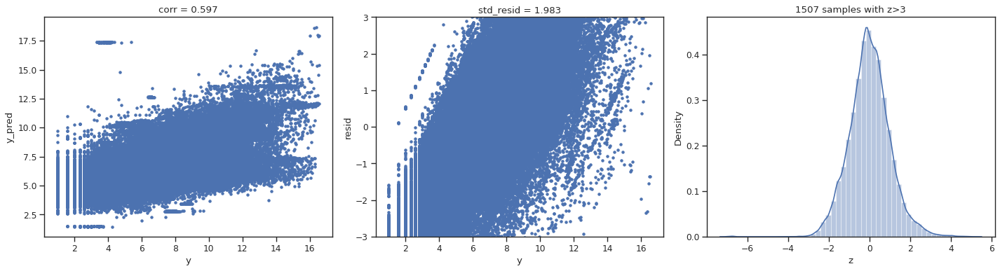

In [40]:
## 岭回归优化
# 利用RidgeCV函数自动寻找最优参数

ridge = RidgeCV()
ridge.fit(X_train, y_train)
print('best_alpha = {0}'.format(ridge.alpha_))
 
y_pred = ridge.predict(X_train)
score(y_train, y_pred)

1507 Outliers:
[106, 247, 352, 482, 561, 601, 933, 964, 1122, 1182, 1318, 1483, 1506, 1570, 1659, 1821, 1936, 2003, 2065, 2124, 2149, 2320, 2425, 2524, 2711, 2844, 3083, 3244, 3300, 3423, 3726, 3846, 3878, 3979, 4071, 4109, 4131, 4177, 4238, 4673, 4836, 4843, 4867, 4881, 4999, 5018, 5731, 6689, 6772, 7146, 7288, 7384, 7564, 7597, 7788, 7831, 7838, 7852, 8229, 8380, 8812, 8903, 9081, 9650, 9750, 9902, 9910, 10149, 10160, 10215, 10626, 11099, 11527, 11609, 11691, 11885, 11938, 12028, 12105, 12224, 12421, 12575, 12739, 12966, 13013, 13055, 13206, 13263, 13972, 14309, 14332, 14363, 14420, 14802, 14951, 15120, 15163, 15332, 15458, 15691, 15731, 15753, 15771, 15845, 15986, 16012, 16040, 16260, 16545, 16857, 16878, 17107, 17276, 17324, 17356, 17545, 17546, 17829, 17951, 18016, 18207, 18293, 18549, 18621, 19296, 19659, 19816, 19981, 20031, 20084, 20131, 20406, 20422, 20487, 20758, 20810, 20916, 21386, 21628, 21831, 21843, 22081, 22116, 22242, 22381, 22877, 22895, 22974, 23092, 23178, 23397, 23

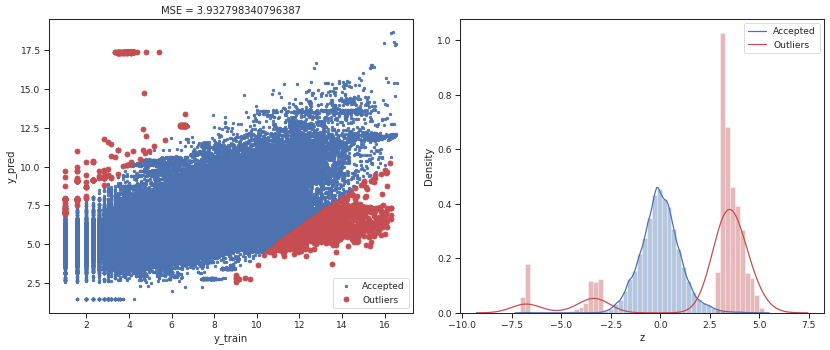

In [41]:
resid = y_train - y_pred
resid = pd.Series(resid, index=range(len(y_train)))
resid_z = (resid-resid.mean()) / resid.std()
outliers = resid_z[abs(resid_z)>3].index
print(f'{len(outliers)} Outliers:')
print(outliers.tolist())
 
plt.figure(figsize=(14,6),dpi=60)
 
plt.subplot(121)
plt.plot(y_train, y_pred, '.')
plt.plot(y_train[outliers], y_pred[outliers], 'ro')
plt.title(f'MSE = {mean_squared_error(y_train,y_pred)}')
plt.legend(['Accepted', 'Outliers'])
plt.xlabel('y_train')
plt.ylabel('y_pred')
 
plt.subplot(122)
sns.distplot(resid_z, bins = 50)
sns.distplot(resid_z.loc[outliers], bins = 50, color = 'r')
plt.legend(['Accepted', 'Outliers'])
plt.xlabel('z')
plt.tight_layout()

In [42]:
# 异常样本点剔除
X_train = np.array(pd.DataFrame(X_train).drop(outliers,axis=0))
y_train = np.array(pd.Series(y_train).drop(outliers,axis=0))

best_alpha = 0.7925115721711881
MSE = 5.836123319788839
R2 = 0.04814645303496923
MAE = 1.9198032276199792
SRC = 0.3486523148424391


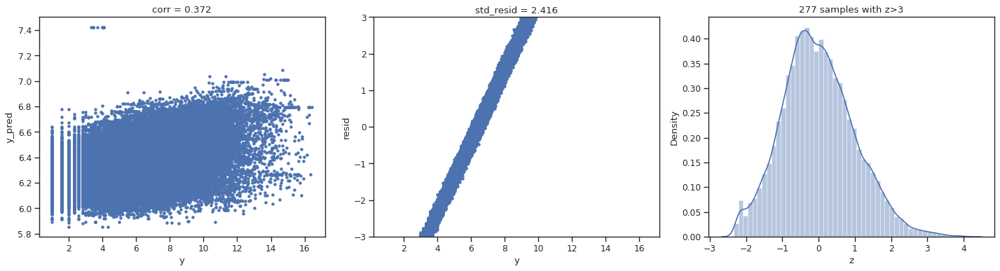

In [43]:
lasso = LassoCV(cv=5)
lasso.fit(X_train, y_train)
print('best_alpha = {0}'.format(lasso.alpha_))
 
pred_lasso = lasso.predict(X_valid)
score(y_valid, pred_lasso)


In [44]:
def gsearch(model, param_grid, scoring='neg_mean_squared_error', splits=5, repeats=1, n_jobs=-1):
    # p次k折交叉验证
    rkfold = RepeatedKFold(n_splits=splits, n_repeats=repeats, random_state=0)
    model_gs = GridSearchCV(model, param_grid=param_grid, scoring=scoring, cv=rkfold, verbose=1, n_jobs=-1)
    model_gs.fit(X_train, y_train)
    print('参数最佳取值: {0}'.format(model_gs.best_params_))
    print('最小均方误差: {0}'.format(abs(model_gs.best_score_)))
    return model_gs

In [45]:
svr = SVR()
cv_params = {'C': np.logspace(0, 3, 4), 'gamma': np.logspace(-4, -1, 4)}
svr = gsearch(svr, cv_params)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


KeyboardInterrupt: 

In [ ]:
svr = SVR()
cv_params = {'C': [1,2,5,10,15,20,30,50,80,100,150,200], 'gamma': [0.0001,0.0005,0.0008,0.001,0.002,0.003,0.005]}
svr = gsearch(svr, cv_params)

In [ ]:
pred_svr = svr.predict(X_valid)
score(y_valid, pred_svr)

In [ ]:
# 初始参数值
params = {'learning_rate': 0.1, 'n_estimators': 500, 'max_depth': 5, 'min_child_weight': 1, 'seed': 0,
          'subsample': 0.8, 'colsample_bytree': 0.8, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 1}

In [ ]:
cv_params = {'n_estimators': [100,200,300,400,500,600,700,800,900,1000,1100,1200]}
xgb = XGBRegressor(**params)
xgb = gsearch(xgb, cv_params)

In [ ]:
# 更新参数
params['n_estimators'] = 800

In [ ]:
cv_params = {'max_depth': [3,4,5,6,7,8,9],
            'min_child_weight': [1,2,3,4,5,6,7]}
xgb = XGBRegressor(**params)
xgb = gsearch(xgb, cv_params)

In [ ]:
# 更新参数  
params['max_depth'] = 5
params['min_child_weight'] = 3

In [ ]:
cv_params = {'gamma': [0,0.01,0.05,0.1,0.2,0.3,0.4,0.5,0.6]}
xgb = XGBRegressor(**params)
xgb = gsearch(xgb, cv_params)

In [ ]:
# 更新参数
params['gamma'] = 0

In [ ]:
cv_params = {'subsample': [0.6,0.7,0.8,0.9],
            'colsample_bytree': [0.6,0.7,0.8,0.9]}
xgb = XGBRegressor(**params)
xgb = gsearch(xgb, cv_params)


In [ ]:
# 更新参数
params['subsample'] = 0.8
params['colsample_bytree'] = 0.8

In [ ]:
cv_params = {'reg_alpha': [0,0.02,0.05,0.1,1,2,3],
             'reg_lambda': [0,0.02,0.05,0.1,1,2,3]}
xgb = XGBRegressor(**params)
xgb = gsearch(xgb, cv_params)

In [ ]:
params['reg_alpha'] = 0
params['reg_lambda'] = 1

In [ ]:
cv_params = {'learning_rate': [0.01, 0.02, 0.03, 0.04, 0.05, 0.07, 0.1, 0.2]}
xgb = XGBRegressor(**params)
xgb = gsearch(xgb, cv_params)

In [ ]:
# 更新参数
params['learning_rate'] = 0.04

In [ ]:
pred_xgb = xgb.predict(X_valid)
score(y_valid, pred_xgb)

In [ ]:
models = [lasso, svr, xgb]
model_names = ['Lasso','SVR','XGB']
plt.figure(figsize=(20,5))
 
for i,m in enumerate(models):
    train_sizes, train_scores, test_scores = learning_curve(m, X, y, cv=5, scoring='neg_mean_squared_error',
                                                            train_sizes=np.linspace(0.1,1.0,5), n_jobs=-1)
    train_scores_mean = -train_scores.mean(axis=1)
    test_scores_mean = -test_scores.mean(axis=1)
    
    plt.subplot(1,3,i+1)
    plt.plot(train_sizes, train_scores_mean, 'o-', label='Train')
    plt.plot(train_sizes, test_scores_mean, '^-', label='Test')
    plt.xlabel('Train_size')
    plt.ylabel('Score')
    plt.ylim([0,0.35])
    plt.title(model_names[i], fontsize=16)
    plt.legend()
    plt.grid()
    
plt.tight_layout()


In [ ]:
def model_mix(pred_1, pred_2, pred_3):
    result = pd.DataFrame(columns=['Lasso','SVR','XGB','Combine'])
    for a in range(5):
        for b in range(1,6):
            for c in range(5):
                y_pred = (a*pred_1 + b*pred_2 + c*pred_3) / (a+b+c)
                mse = mean_squared_error(y_valid, y_pred)
                result = result.append([{'Lasso':a, 'SVR':b, 'XGB':c, 'Combine':mse}], ignore_index=True)
    return result
 
model_combine = model_mix(pred_lasso, pred_svr, pred_xgb)
model_combine.sort_values(by='Combine', inplace=True)
model_combine.head()

In [ ]:
X_test = np.array(dtest)
ans_lasso = lasso.predict(X_test)
ans_svr = svr.predict(X_test)
ans_xgb = xgb.predict(X_test)
ans_mix = (ans_lasso + 5 * ans_svr + 2 * ans_xgb) / 8
pd.Series(ans_mix).to_csv('正态+标准化.txt', sep='\t', index=False)
print('Finished!')

In [9]:
## 对已有特征进行增加
## 1. 增加view-fave转化比等
train_ori['view_Faves'] = (train_ori['meanView'] + 1) / (train_ori['meanFaves'] + 1)
train_ori['view_Follower'] = (train_ori['meanView'] + 1) / (train_ori['followerCount'] + 1)
train_ori['view_Following'] = (train_ori['meanView'] + 1) / (train_ori['followingCount'] + 1)
test_ori['view_Faves'] = (test_ori['meanView'] + 1) / (test_ori['meanFaves'] + 1)
test_ori['view_Follower'] = (test_ori['meanView'] + 1) / (test_ori['followerCount'] + 1)
test_ori['view_Following'] = (test_ori['meanView'] + 1) / (test_ori['followingCount'] + 1)

In [15]:
## 2.加入title与tag的比值
train_ori['title_tag_len'] = (train_ori['Alltags_len'] + 1) / (train_ori['Title_len'] + 1)
train_ori['title_tag_num'] = (train_ori['Alltags_number'] + 1) / (train_ori['Title_number'] + 1)
test_ori['title_tag_len'] = (test_ori['Alltags_len'] + 1) / (test_ori['Title_len'] + 1)
test_ori['title_tag_num'] = (test_ori['Alltags_number'] + 1) / (test_ori['Title_number'] + 1)

IndexError: single positional indexer is out-of-bounds

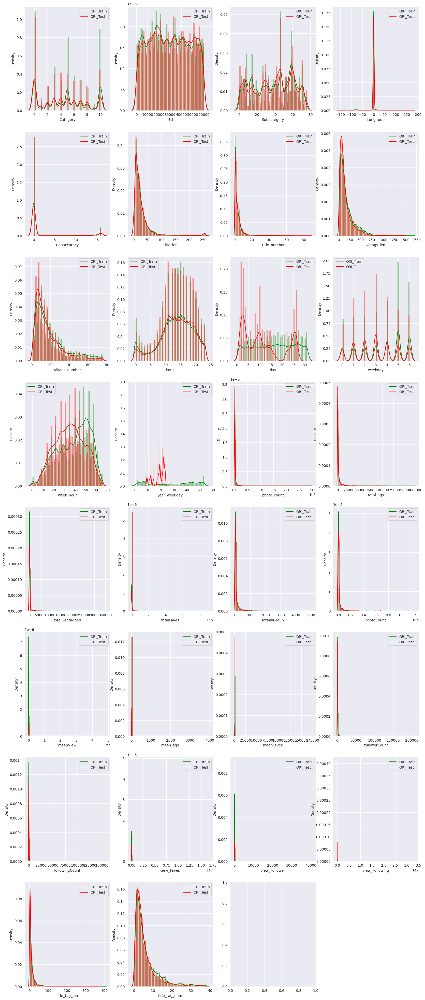

In [16]:
plt.figure(figsize=(20,50),dpi=100)
for i in range(32):
    plt.subplot(8,4,i+1)
    sns.distplot(train_ori.iloc[:,i], color='green')
    sns.distplot(test_ori.iloc[:,i], color='red')
    plt.legend(['ORI_Train','ORI_Test'])
plt.tight_layout()

In [19]:
## 对带label的进行分析
import numpy as np
train_ori_wlabel['view_Faves'] = (train_ori_wlabel['meanView'] + 1) / (train_ori_wlabel['meanFaves'] + 1)
train_ori_wlabel['view_Follower'] = (train_ori_wlabel['meanView'] + 1) / (train_ori_wlabel['followerCount'] + 1)
train_ori_wlabel['view_Following'] = (train_ori_wlabel['meanView'] + 1) / (train_ori_wlabel['followingCount'] + 1)
train_ori_wlabel['title_tag_len'] = (train_ori_wlabel['Alltags_len'] + 1) / (train_ori_wlabel['Title_len'] + 1)
train_ori_wlabel['title_tag_num'] = (train_ori_wlabel['Alltags_number'] + 1) / (train_ori_wlabel['Title_number'] + 1)
train_ori_wlabel['exp_label'] = (train_ori_wlabel['label'] - 1).apply(np.exp2)

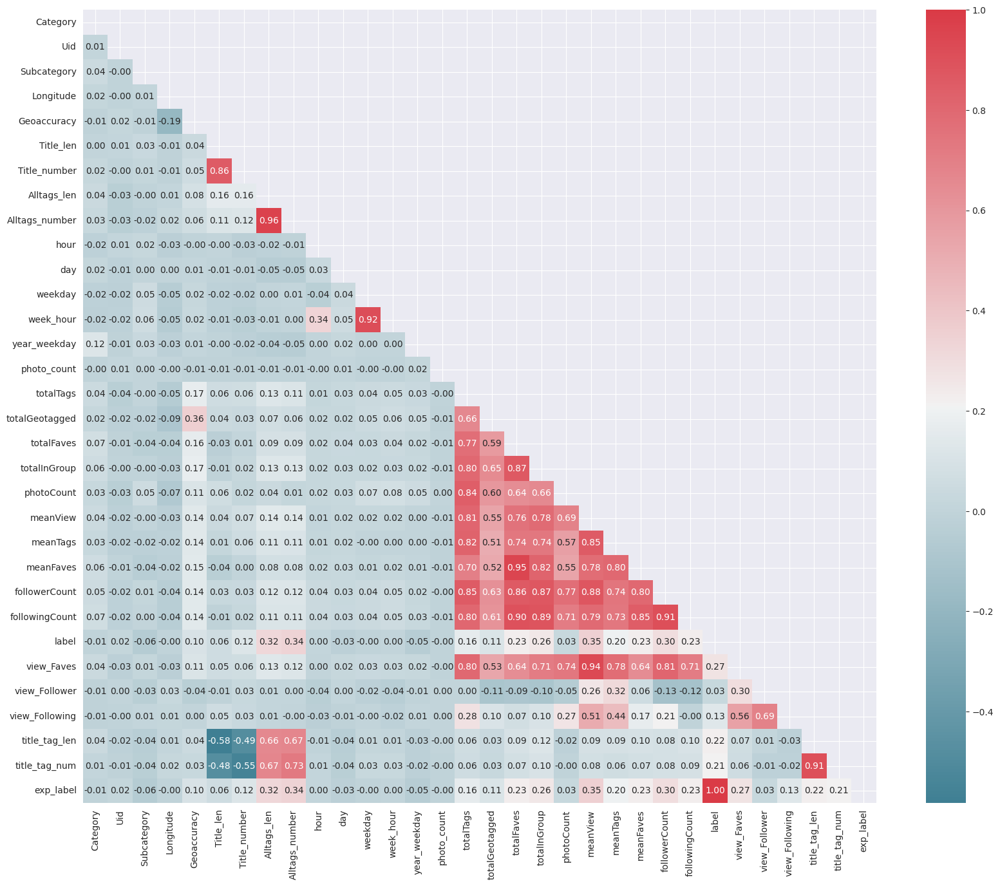

In [20]:
## 画出corr图
# 找出相关程度
plt.figure(figsize=(20, 16))  # 指定绘图对象宽度和高度
colnm = train_ori_wlabel.columns.tolist()  # 列表头
mcorr = train_ori_wlabel[colnm].corr(method="spearman")  # 相关系数矩阵，即给出了任意两个变量之间的相关系数
mask = np.zeros_like(mcorr, dtype=np.bool_)  # 构造与mcorr同维数矩阵 为bool型
mask[np.triu_indices_from(mask)] = True  # 角分线右侧为True
cmap = sns.diverging_palette(220, 10, as_cmap=True)  # 返回matplotlib colormap对象
g = sns.heatmap(mcorr, mask=mask, cmap=cmap, square=True, annot=True, fmt='0.2f')  # 热力图（看两两相似度）
plt.show()

In [ ]:
## 差异过大的数据分布为：day, year_weekday, weekday, weekhour, /meanView

In [7]:
## 计算两个分布之间的KS检验值
from scipy import stats
features_list = train_ori.columns.values.tolist()
for feature in features_list:
    statistic, p_value = stats.kstest(train_ori[feature], test_ori[feature])
    print("KS test value: %.3f" %statistic, "with a p-value %.2f" %p_value, "for the feature",feature)

KS test value: 0.099 with a p-value 0.00 for the feature Category
KS test value: 0.020 with a p-value 0.00 for the feature Uid
KS test value: 0.046 with a p-value 0.00 for the feature Subcategory
KS test value: 0.010 with a p-value 0.00 for the feature Longitude
KS test value: 0.009 with a p-value 0.00 for the feature Geoaccuracy
KS test value: 0.011 with a p-value 0.00 for the feature Title_len
KS test value: 0.007 with a p-value 0.00 for the feature Title_number
KS test value: 0.100 with a p-value 0.00 for the feature Alltags_len
KS test value: 0.082 with a p-value 0.00 for the feature Alltags_number
KS test value: 0.022 with a p-value 0.00 for the feature hour
KS test value: 0.283 with a p-value 0.00 for the feature day
KS test value: 0.196 with a p-value 0.00 for the feature weekday
KS test value: 0.172 with a p-value 0.00 for the feature week_hour
KS test value: 0.618 with a p-value 0.00 for the feature year_weekday
KS test value: 0.038 with a p-value 0.00 for the feature photo_co

In [5]:
columns_label = ['Category', 'Uid', 'Subcategory', 'Longitude', 'Geoaccuracy',  
         'Title_len', 'Title_number','Alltags_len','Alltags_number', 'hour', 'day','weekday','week_hour',
          'year_weekday','photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          'followingCount', 'label']
train_ori_wlabel = train_all_data[columns_label]

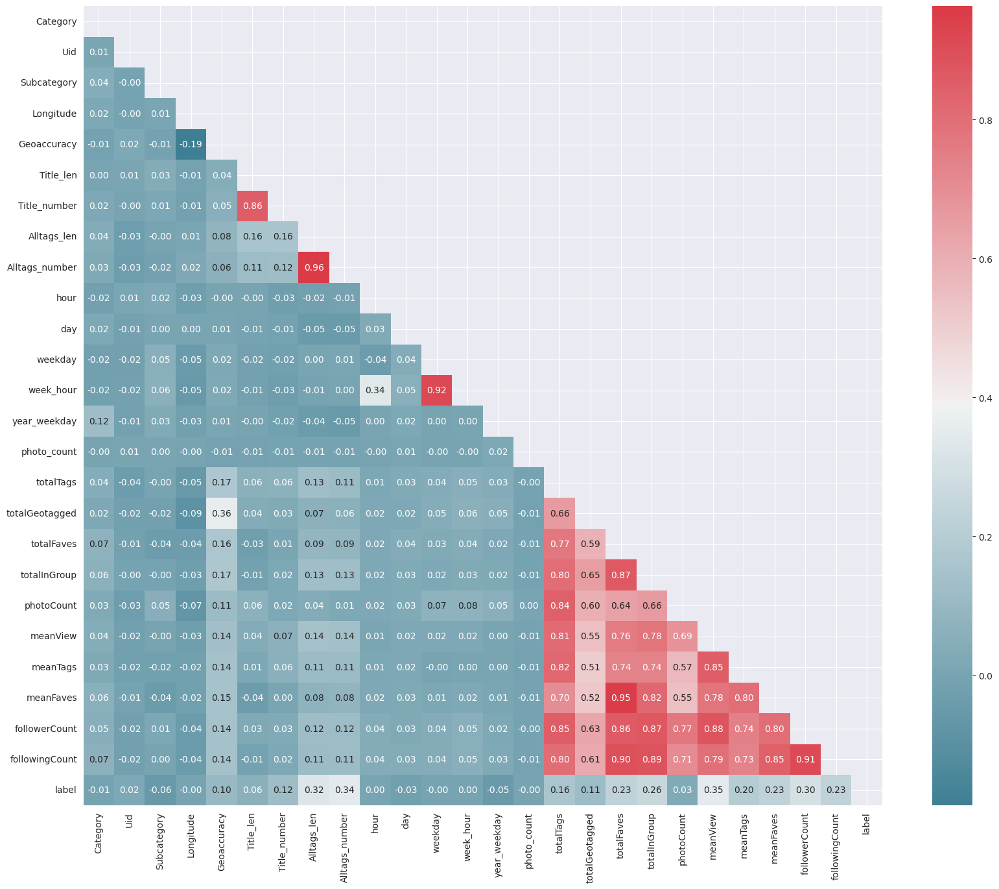

In [6]:
## 画出corr图
# 找出相关程度
plt.figure(figsize=(20, 16))  # 指定绘图对象宽度和高度
colnm = train_ori_wlabel.columns.tolist()  # 列表头
mcorr = train_ori_wlabel[colnm].corr(method="spearman")  # 相关系数矩阵，即给出了任意两个变量之间的相关系数
mask = np.zeros_like(mcorr, dtype=np.bool_)  # 构造与mcorr同维数矩阵 为bool型
mask[np.triu_indices_from(mask)] = True  # 角分线右侧为True
cmap = sns.diverging_palette(220, 10, as_cmap=True)  # 返回matplotlib colormap对象
g = sns.heatmap(mcorr, mask=mask, cmap=cmap, square=True, annot=True, fmt='0.2f')  # 热力图（看两两相似度）
plt.show()

In [ ]:
## 考虑下怎么转化，是取log还是怎么说
## 新建新的index,使之与强相关的几个参数也相关
## 由于popularity是与view正相关，和date负相关，可以考虑计算下照片拍摄时间和post时间


In [153]:
## 对偏度高的进行运算
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
columns = ['Category', 'Uid', 'Subcategory', 'Longitude', 'Geoaccuracy',  
         'Title_len', 'Title_number','Alltags_len','Alltags_number', 'hour', 'day','weekday','week_hour',
          'year_weekday','photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          'followingCount']


skew_features = all_data[columns].apply(lambda x: abs(skew(x))).sort_values(ascending=False)

high_skew = skew_features[skew_features > 0.75]
skew_index = high_skew.index

for i in skew_index:
    print(i)
    all_data[i] = boxcox1p(all_data[i], boxcox_normmax(all_data[i] + 1))
      
# skewed_features = skewness.index
# lam = 0.15
# for feat in skewed_features:
    #all_data[feat] += 1
    # all_data[feat] = boxcox1p(all_data[feat], lam)
    # boxcox1p(features[i], boxcox_normmax(features[i] + 1))

Geoaccuracy
Alltags_len
Alltags_number
totalGeotagged


In [157]:
train_fea_norm = all_data[:305613] 
test_fea_norm = all_data[-180581:]

In [162]:
train_fea_norm = train_fea_norm[columns]
test_fea_norm = test_fea_norm[columns]
from scipy import stats

features_list = train_fea_norm.columns.values.tolist()
for feature in features_list:
    statistic, p_value = stats.kstest(train_fea_norm[feature], test_fea_norm[feature])
    print("KS test value: %.3f" %statistic, "with a p-value %.2f" %p_value, "for the feature",feature)

KS test value: 0.099 with a p-value 0.00 for the feature Category
KS test value: 0.020 with a p-value 0.00 for the feature Uid
KS test value: 0.046 with a p-value 0.00 for the feature Subcategory
KS test value: 0.010 with a p-value 0.00 for the feature Longitude
KS test value: 0.009 with a p-value 0.00 for the feature Geoaccuracy
KS test value: 0.011 with a p-value 0.00 for the feature Title_len
KS test value: 0.007 with a p-value 0.00 for the feature Title_number
KS test value: 0.100 with a p-value 0.00 for the feature Alltags_len
KS test value: 0.082 with a p-value 0.00 for the feature Alltags_number
KS test value: 0.022 with a p-value 0.00 for the feature hour
KS test value: 0.283 with a p-value 0.00 for the feature day
KS test value: 0.196 with a p-value 0.00 for the feature weekday
KS test value: 0.172 with a p-value 0.00 for the feature week_hour
KS test value: 0.618 with a p-value 0.00 for the feature year_weekday
KS test value: 0.038 with a p-value 0.00 for the feature photo_co

In [163]:
train_fea_norm

,Category,Uid,Subcategory,Longitude,Geoaccuracy,Title_len,Title_number,Alltags_len,Alltags_number,hour,...,totalTags,totalGeotagged,totalFaves,totalInGroup,photoCount,meanView,meanTags,meanFaves,followerCount,followingCount
0,5,21894,65,0.00000,0.000000,3.519750,1.441452,6.361443,2.555321,15,...,17.074966,0.000000,6.225702,5.541147,13.562772,12.580516,0.204614,0.009026,10.941868,9.184455
1,0,53866,75,0.00000,0.000000,4.034364,1.770778,9.738726,4.164007,10,...,19.661400,3.781180,7.790222,7.108573,30.680443,9.073105,0.045403,0.009025,13.478312,6.057103
2,3,26948,42,0.00000,0.000000,2.561451,0.923621,7.014687,3.163281,8,...,18.268705,0.625140,7.088547,1.114475,12.558005,12.961366,0.206620,0.009026,10.119285,8.251433
3,10,355,68,0.00000,0.000000,2.939829,1.115668,5.180134,2.294824,0,...,21.375903,3.894827,9.711606,6.442438,33.641363,6.349788,0.040436,0.009026,9.702653,8.007020
4,2,315,43,0.00000,0.000000,2.194657,0.620507,6.581874,2.982604,0,...,21.052285,1.930333,0.000000,4.925962,20.267281,13.035654,0.184229,0.000000,12.676953,2.771469
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305608,4,8689,7,0.00000,0.000000,2.299766,0.620507,7.601585,3.564744,15,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
305609,6,7509,48,0.00000,0.000000,1.608060,0.620507,5.277387,2.294824,17,...,12.551596,2.053980,5.562502,3.660602,9.084262,9.797601,0.206305,0.009026,5.914521,3.951012
305610,0,52220,60,0.00000,0.000000,2.561451,0.620507,5.658634,2.190157,15,...,13.943273,0.000000,7.609560,5.698257,12.625756,10.201743,0.198216,0.009026,9.704115,7.850954
305611,7,20298,55,0.00000,0.000000,2.077142,1.115668,6.581874,2.982604,11,...,28.911681,5.394187,11.732553,8.853011,21.650634,12.316548,0.205269,0.009026,14.792423,11.871226


In [158]:
train_fea_norm

,Pid,train_type,Uid,Uid_count,mean_label,Category,Subcategory,Concept,Title_len,Title_number,...,title_fe_290,title_fe_291,title_fe_292,title_fe_293,title_fe_294,title_fe_295,title_fe_296,title_fe_297,title_fe_298,title_fe_299
0,775,0,21894,4,8.690000,5,65,75,3.519750,1.441452,...,-0.055784,0.197610,-0.166620,-0.007064,0.308736,0.138135,0.149598,0.184107,-0.049617,0.011684
1,1075,0,53866,13,7.525385,0,75,139,4.034364,1.770778,...,0.296695,0.087271,0.126468,-0.103056,0.147320,0.193802,0.035001,-0.045986,0.080715,0.078193
2,4890,0,26948,1,10.990000,3,42,480,2.561451,0.923621,...,0.168270,0.003270,0.171345,0.108478,0.349160,-0.396890,-0.205695,0.068778,-0.128545,-0.080683
3,6568,0,355,1,8.630000,10,68,225,2.939829,1.115668,...,0.109710,0.117009,0.245160,-0.306995,0.387836,0.111045,0.157754,-0.086720,0.220020,-0.045470
4,7079,0,315,31,8.489677,2,43,317,2.194657,0.620507,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305608,1118328,2,8689,7,5.645714,4,7,194,2.299766,0.620507,...,-0.705970,-0.740560,0.477140,-0.055602,0.229310,-0.219060,0.244150,-0.113470,-0.038659,0.636760
305609,1118334,2,7509,1,1.000000,6,48,282,1.608060,0.620507,...,0.277580,0.646810,-0.621820,0.342440,0.065437,-0.115160,-0.183480,-0.376420,-0.089649,-0.296500
305610,1118342,2,52220,3,2.826667,0,60,390,2.561451,0.620507,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
305611,1118344,2,20298,112,10.689821,7,55,527,2.077142,1.115668,...,-0.076936,-0.454270,-0.037311,0.468153,-0.178730,-0.034247,0.136299,0.051963,0.343003,-0.322013


In [160]:
test_fea_norm = test_fea_norm.reset_index(drop=True)
test_fea_norm

,Pid,train_type,Uid,Uid_count,mean_label,Category,Subcategory,Concept,Title_len,Title_number,...,title_fe_290,title_fe_291,title_fe_292,title_fe_293,title_fe_294,title_fe_295,title_fe_296,title_fe_297,title_fe_298,title_fe_299
0,50731,-1,48249,1,0.000000,6,13,352,2.194657,0.923621,...,-0.121735,0.021623,0.204132,-0.358730,0.233779,-0.401930,0.174435,-0.555150,0.088762,-0.334895
1,96454,-1,58858,11,8.705455,3,71,573,5.430978,2.182161,...,0.024520,-0.129912,-0.017224,-0.007224,0.062414,0.021764,-0.037089,-0.096281,0.130909,0.014050
2,172136,-1,58858,11,8.705455,2,33,253,3.998798,1.620176,...,-0.146950,-0.262795,0.107282,0.182885,0.082495,0.202486,0.063760,-0.098770,0.110895,0.053098
3,177707,-1,27151,176,4.247443,3,71,232,3.603987,1.441452,...,0.189475,-0.195072,-0.401882,-0.016685,0.318932,0.315990,0.244958,0.061973,0.081797,-0.175070
4,177708,-1,27151,176,4.247443,3,71,232,3.603987,1.441452,...,0.189475,-0.195072,-0.401882,-0.016685,0.318932,0.315990,0.244958,0.061973,0.081797,-0.175070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180576,1118324,-1,46088,2,4.380000,0,35,301,1.943896,0.620507,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
180577,1118329,-1,12280,7,1.382857,0,60,110,3.252453,1.252726,...,0.134555,0.186670,0.330580,0.227405,0.155600,-0.088244,0.144885,-0.199950,0.033038,-0.065841
180578,1118336,-1,43496,9,3.674444,4,28,186,3.730244,1.510804,...,0.156818,-0.107772,0.157098,-0.079490,0.042594,-0.034590,-0.349488,0.016242,-0.172004,-0.012735
180579,1118349,-1,5492,17,5.671176,7,27,54,2.768501,1.115668,...,0.142362,-0.097873,-0.026855,0.195713,-0.101540,0.240027,-0.119417,-0.012023,0.021850,-0.081305


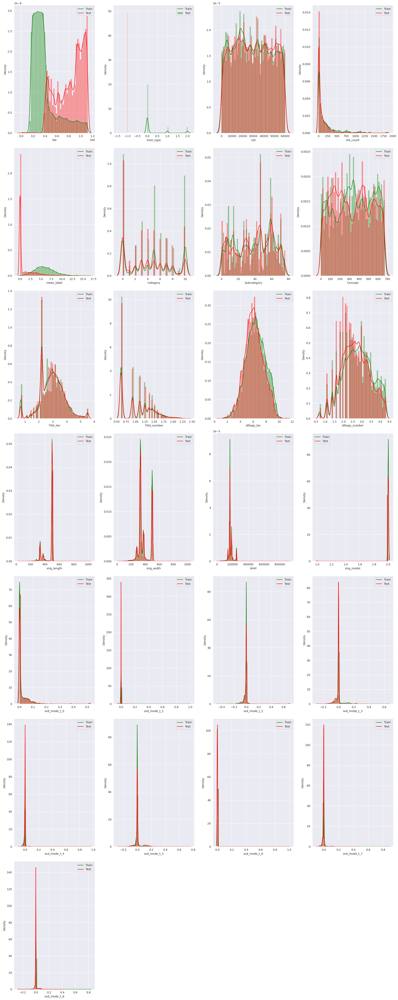

In [161]:
plt.figure(figsize=(20,50),dpi=100)
for i in range(25):
    plt.subplot(7,4,i+1)
    sns.distplot(train_fea_norm.iloc[:,i], color='green')
    sns.distplot(test_fea_norm.iloc[:,i], color='red')
    plt.legend(['Train','Test'])
plt.tight_layout()

In [124]:
# columns1 = ['Category', 'Subcategory','Mediatype',  'Geoaccuracy', 'Latitude',
#          'Title_len', 'Title_number','Alltags_len','Alltags_number', 'hour', 'day','weekday','week_hour',
#           'year_weekday','photo_count']
# columns2 = ['totalTags', 'totalGeotagged', 'totalFaves',
#           'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
#           'followingCount']
columns = ['Category', 'Uid', 'Subcategory','Mediatype', 'Longitude', 'Geoaccuracy', 'Latitude',
         'Title_len', 'Title_number','Alltags_len','Alltags_number', 'hour', 'day','weekday','week_hour',
          'year_weekday','photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          'followingCount', 'label']
columns1 = ['Category', 'Uid', 'Subcategory','Mediatype', 'Longitude', 'Geoaccuracy', 'Latitude',
         'Title_len', 'Title_number','Alltags_len','Alltags_number', 'hour', 'day','weekday','week_hour',
          'year_weekday','photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
          'followingCount']
test_fea = submit_feature_df[columns1]

In [125]:
train_fea = train_all_data[columns]
# test_fea = submit_feature_df[columns]
# train_fea1 = train_feature_df[columns1]
# test_fea1 = submit_feature_df[columns1]
# train_fea2 = train_feature_df[columns2]
# test_fea2 = submit_feature_df[columns2]

In [134]:
dfull = pd.concat([train_fea, test_fea], ignore_index=True, sort=False)

IndexError: single positional indexer is out-of-bounds

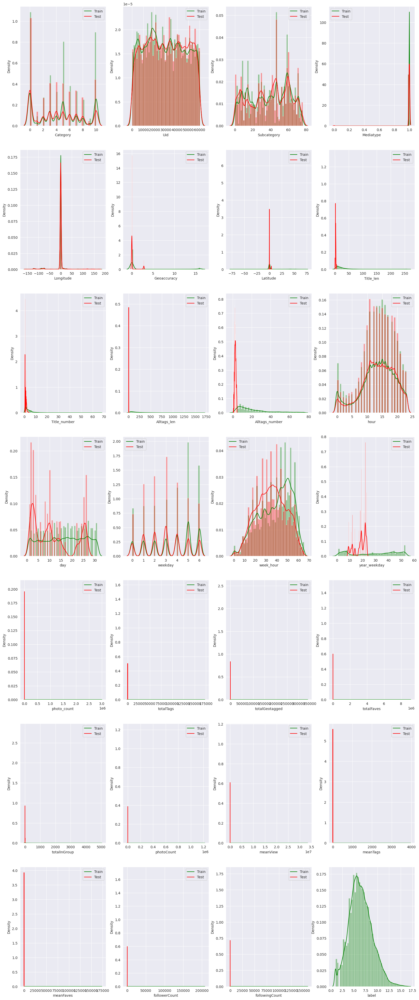

In [118]:
plt.figure(figsize=(20,50),dpi=100)
for i in range(28):
    plt.subplot(7,4,i+1)
    sns.distplot(train_fea.iloc[:,i], color='green')
    sns.distplot(test_fea.iloc[:,i], color='red')
    plt.legend(['Train','Test'])
plt.tight_layout()

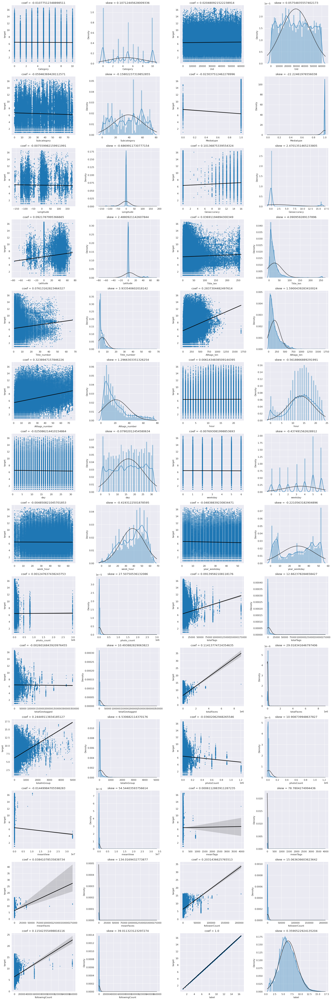

In [119]:
plt.figure(figsize=(20,60),dpi=80)
i = 0
for col in train_fea.columns:
    i += 1
    plt.subplot(14,4,i)
    sns.regplot(x = col, y = 'label', data = train_fea,
               scatter_kws = {'marker': '.', 's': 5, 'alpha': .6},
               line_kws = {'color': 'k'})
    coef = np.corrcoef(train_fea[col], train_fea['label'])[0][1]
    plt.title(f'coef = {coef}')
    plt.xlabel(col)
    plt.ylabel('target')
    
    i += 1
    plt.subplot(14,4,i)
    sns.distplot(train_fea[col], fit = stats.norm)
    plt.title(f'skew = {stats.skew(train_fea[col])}')
    plt.xlabel(col)
    

plt.tight_layout()

In [120]:
plt.tight_layout()

<Figure size 640x480 with 0 Axes>

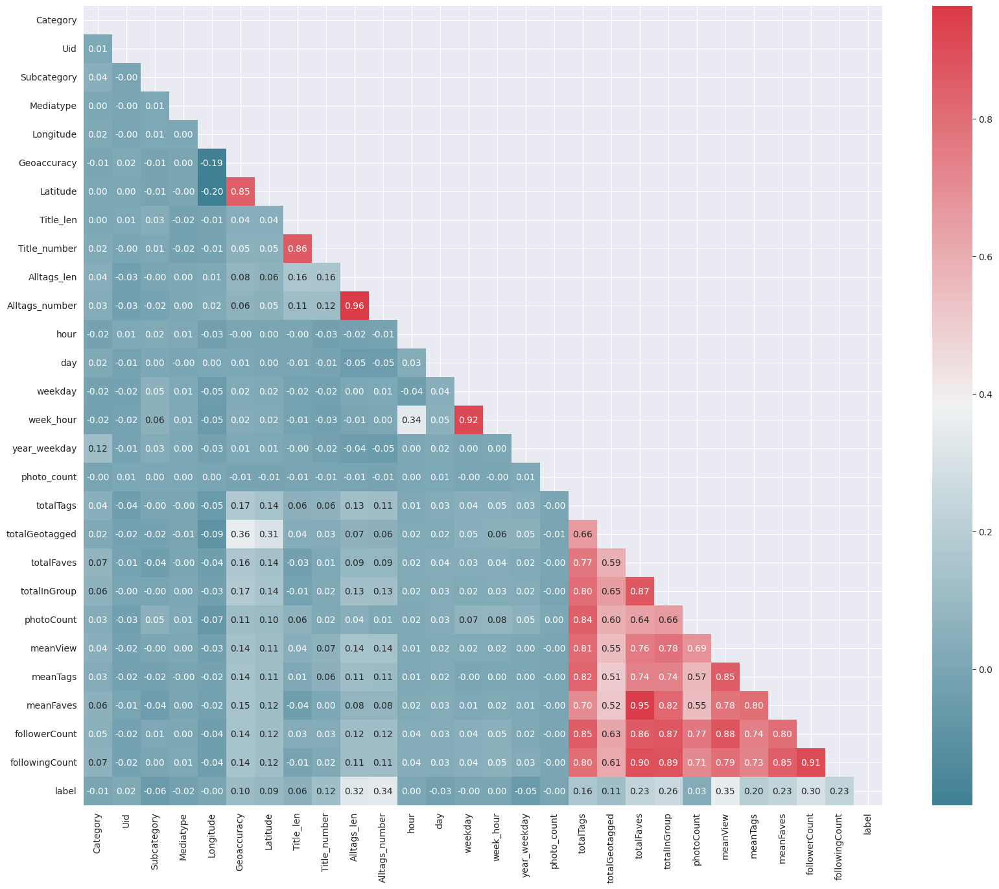

In [130]:
# 找出相关程度
plt.figure(figsize=(20, 16))  # 指定绘图对象宽度和高度
colnm = train_fea.columns.tolist()  # 列表头
mcorr = train_fea[colnm].corr(method="spearman")  # 相关系数矩阵，即给出了任意两个变量之间的相关系数
mask = np.zeros_like(mcorr, dtype=np.bool_)  # 构造与mcorr同维数矩阵 为bool型
mask[np.triu_indices_from(mask)] = True  # 角分线右侧为True
cmap = sns.diverging_palette(220, 10, as_cmap=True)  # 返回matplotlib colormap对象
g = sns.heatmap(mcorr, mask=mask, cmap=cmap, square=True, annot=True, fmt='0.2f')  # 热力图（看两两相似度）
plt.show()

In [131]:
train_fea

,Category,Uid,Subcategory,Mediatype,Longitude,Geoaccuracy,Latitude,Title_len,Title_number,Alltags_len,...,totalGeotagged,totalFaves,totalInGroup,photoCount,meanView,meanTags,meanFaves,followerCount,followingCount,label
0,5,21894,65,1,0.00000,1.010000,1.000000,1.388690,1.061520,3.573846,...,0,904,176,1446,4299.470263,1.531812,0.625173,2405,2729,11.18
1,0,53866,75,1,0.00000,1.010000,1.000000,1.745810,1.138093,2864.831123,...,542,6200,679,75883,735.884072,0.052594,0.081705,8491,236,15.15
2,3,26948,42,1,0.00000,1.010000,1.000000,1.126825,1.020100,6.492594,...,1,2583,2,1039,5124.185756,2.820019,2.486044,1550,1346,10.99
3,10,355,68,1,0.00000,1.010000,1.000000,1.196147,1.030301,1.834864,...,716,76088,385,124017,148.035342,0.046018,0.613529,1233,1115,8.63
4,2,315,43,1,0.00000,1.010000,1.000000,1.082857,1.010000,4.274847,...,12,0,102,9218,5300.882729,0.579735,0.000000,5781,13,11.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
305608,4,8689,7,1,0.00000,1.010000,1.000000,1.093685,1.010000,13.558134,...,0,0,0,0,0.000000,0.000000,0.000000,0,0,4.00
305609,6,7509,48,1,0.00000,1.010000,1.000000,1.040604,1.010000,1.909366,...,15,411,32,284,1085.735915,2.313380,1.447183,122,39,1.00
305610,0,52220,60,1,0.00000,1.010000,1.000000,1.126825,1.010000,2.283884,...,0,4939,202,1063,1340.824083,0.925682,4.646284,1234,988,2.00
305611,7,20298,55,1,0.00000,1.010000,1.000000,1.072135,1.030301,4.274847,...,56369,1291341,2882,12738,3800.696577,1.711336,101.377061,15549,18945,6.89


In [132]:
test_fea

,Category,Uid,Subcategory,Mediatype,Longitude,Geoaccuracy,Latitude,Title_len,Title_number,Alltags_len,...,totalTags,totalGeotagged,totalFaves,totalInGroup,photoCount,meanView,meanTags,meanFaves,followerCount,followingCount
0,6,48249,13,1,0.00000,0,0.000000,8,2,96,...,0,0,0,0,0,0.000000,0.000000,0.000000,0,0
1,3,58858,71,1,0.00000,0,0.000000,231,44,324,...,15862,22027,32753,1747,4382,7133.092195,3.619808,7.474441,1972,470
2,2,58858,33,1,0.00000,0,0.000000,54,9,126,...,15862,22027,32753,1747,4382,7133.092195,3.619808,7.474441,1972,470
3,3,27151,71,1,0.00000,0,0.000000,36,6,141,...,23,0,0,3,1387,1625.556597,0.016583,0.000000,97,0
4,3,27151,71,1,0.00000,0,0.000000,36,6,141,...,23,0,0,3,1387,1625.556597,0.016583,0.000000,97,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180576,0,46088,35,1,0.00000,0,0.000000,6,1,78,...,987,40,4341,84,347,833.933718,2.844380,12.510086,489,612
180577,0,12280,60,1,0.00000,0,0.000000,25,4,164,...,0,0,0,0,0,0.000000,0.000000,0.000000,0,0
180578,4,43496,28,1,4.88361,15,52.377734,41,7,85,...,21861,6422,5225,98,6556,1611.040268,3.334503,0.796980,702,113
180579,7,5492,27,1,0.00000,0,0.000000,15,3,305,...,5677,741,24679,373,2138,2480.537418,2.655285,11.543031,1092,389


In [135]:
dfull

,Category,Uid,Subcategory,Mediatype,Longitude,Geoaccuracy,Latitude,Title_len,Title_number,Alltags_len,...,totalGeotagged,totalFaves,totalInGroup,photoCount,meanView,meanTags,meanFaves,followerCount,followingCount,label
0,5,21894,65,1,0.00000,1.01,1.000000,1.388690,1.061520,3.573846,...,0,904,176,1446,4299.470263,1.531812,0.625173,2405,2729,11.18
1,0,53866,75,1,0.00000,1.01,1.000000,1.745810,1.138093,2864.831123,...,542,6200,679,75883,735.884072,0.052594,0.081705,8491,236,15.15
2,3,26948,42,1,0.00000,1.01,1.000000,1.126825,1.020100,6.492594,...,1,2583,2,1039,5124.185756,2.820019,2.486044,1550,1346,10.99
3,10,355,68,1,0.00000,1.01,1.000000,1.196147,1.030301,1.834864,...,716,76088,385,124017,148.035342,0.046018,0.613529,1233,1115,8.63
4,2,315,43,1,0.00000,1.01,1.000000,1.082857,1.010000,4.274847,...,12,0,102,9218,5300.882729,0.579735,0.000000,5781,13,11.16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
486189,0,46088,35,1,0.00000,0.00,0.000000,6.000000,1.000000,78.000000,...,40,4341,84,347,833.933718,2.844380,12.510086,489,612,NaN
486190,0,12280,60,1,0.00000,0.00,0.000000,25.000000,4.000000,164.000000,...,0,0,0,0,0.000000,0.000000,0.000000,0,0,NaN
486191,4,43496,28,1,4.88361,15.00,52.377734,41.000000,7.000000,85.000000,...,6422,5225,98,6556,1611.040268,3.334503,0.796980,702,113,NaN
486192,7,5492,27,1,0.00000,0.00,0.000000,15.000000,3.000000,305.000000,...,741,24679,373,2138,2480.537418,2.655285,11.543031,1092,389,NaN


In [121]:
## 对偏态数据进行转换
## 根据上述图像，得到的偏态特征为：
# columns = ['Category', 'Uid', 'Subcategory','Mediatype', 'Longitude', 'Geoaccuracy', 'Latitude',
#          'Title_len', 'Title_number','Alltags_len','Alltags_number', 'hour', 'day','weekday','week_hour',
#           'year_weekday','photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
#           'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
#           'followingCount']
# 分布呈明显左偏的特征
piantai = ['Geoaccuracy','Title_len','Title_number','Alltags_len','Alltags_number','photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
          'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount', 'followingCount']
 
# 创建函数——找到令偏态系数绝对值最小的对数转换的底
def find_min_skew(data):
    subs = list(np.arange(1.01,2,0.01))
    skews = []
    for x in subs:
        skew = abs(stats.skew(np.power(x,data)))
        skews.append(skew)
    min_skew = min(skews)
    i = skews.index(min_skew)
    return subs[i], min_skew

In [ ]:
# stats.boxcox1p
plt.figure(figsize=(20,60),dpi=80)
import tqdm
i = 0
for col in tqdm(piantai):
    from scipy.special import boxcox1p
skewed_features = skewness.index
lam = 0.15
for feat in skewed_features:
    #all_data[feat] += 1
    all_data[feat] = boxcox1p(all_data[feat], lam)
    
plt.tight_layout()
    
    # 正态化之前的偏态特征与结果变量相关图与正态分布图
    i += 1
    plt.subplot(17,4,i)
    sns.regplot(x = col, y = 'label', data = train_fea,
               scatter_kws = {'marker': '.', 's': 5, 'alpha': .6},
               line_kws = {'color': 'k'})
    coef = np.corrcoef(train_fea[col], train_fea['label'])[0][1]
    plt.title(f'coef = {coef}')
    plt.xlabel(col)
    plt.ylabel('target')
    
    i += 1
    plt.subplot(17,4,i)
    sns.distplot(train_fea[col], fit = stats.norm)
    plt.title(f'skew = {stats.skew(train_fea[col])}')
    plt.xlabel(col)
    
#     # 找到合适的底数，对dtrain的偏态特征进行对数转换
#     sub = find_min_skew(dfull[col])[0]
#     train_fea[col] = np.power(sub, train_fea[col])
    
#     # 对数转换之后特征与结果变量相关图与正态分布图
#     i += 1
#     plt.subplot(17,4,i)
#     sns.regplot(x = col, y = 'label', data = train_fea,
#                scatter_kws = {'marker': '.', 's': 5, 'alpha': .6},
#                line_kws = {'color': 'k'})
#     coef = np.corrcoef(train_fea[col], train_fea['label'])[0][1]
#     plt.title(f'coef = {coef}')
#     plt.xlabel(col+' transformed')
#     plt.ylabel('target')
    
#     i += 1
#     plt.subplot(17,4,i)
#     sns.distplot(train_fea[col], fit = stats.norm)
#     plt.title(f'skew = {stats.skew(train_fea[col])}')
#     plt.xlabel(col+' transformed')
skewness = skewness[abs(skewness) > 0.75]
print("There are {} skewed numerical features to Box Cox transform".format(skewness.shape[0]))

from scipy.special import boxcox1p
skewed_features = skewness.index
lam = 0.15
for feat in skewed_features:
    #all_data[feat] += 1
    all_data[feat] = boxcox1p(all_data[feat], lam)
    
plt.tight_layout()

In [ ]:
# for var in cols_numeric:
#     if var!='target':
#         dat = data_all[[var, 'target']].dropna()
        
#         i+=1
#         plt.subplot(frows,fcols,i)
#         sns.distplot(dat[var] , fit=stats.norm);
#         plt.title(var+' Original')
#         plt.xlabel('')
        
#         i+=1
#         plt.subplot(frows,fcols,i)
#         _=stats.probplot(dat[var], plot=plt)
#         plt.title('skew='+'{:.4f}'.format(stats.skew(dat[var])))
#         plt.xlabel('')
#         plt.ylabel('')
        
#         i+=1
#         plt.subplot(frows,fcols,i)
#         plt.plot(dat[var], dat['target'],'.',alpha=0.5)
#         plt.title('corr='+'{:.2f}'.format(np.corrcoef(dat[var], dat['target'])[0][1]))
 
#         i+=1
#         plt.subplot(frows,fcols,i)
#         trans_var, lambda_var = stats.boxcox(dat[var].dropna()+1)
#         trans_var = scale_minmax(trans_var)      
#         sns.distplot(trans_var , fit=stats.norm);
#         plt.title(var+' Tramsformed')
#         plt.xlabel('')
        
#         i+=1
#         plt.subplot(frows,fcols,i)
#         _=stats.probplot(trans_var, plot=plt)
#         plt.title('skew='+'{:.4f}'.format(stats.skew(trans_var)))
#         plt.xlabel('')
#         plt.ylabel('')
        
#         i+=1
#         plt.subplot(frows,fcols,i)
#         plt.plot(trans_var, dat['target'],'.',alpha=0.5)
#         plt.title('corr='+'{:.2f}'.format(np.corrcoef(trans_var,dat['target'])[0][1]))

/usr/local/lib/python3.8/dist-packages/scipy/stats/_stats_py.py:1205: RuntimeWarning: overflow encountered in multiply
  s *= a_zero_mean
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.8/dist-packages/scipy/stats/_stats_py.py:1199: RuntimeWarning: overflow encountered in square
  s = a_zero_mean**2
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:181: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.8/dist-packages/scipy/stats/_stats_py.py:1203: RuntimeWarning: overflow encountered in square
  s = s**2
/usr/local/lib/python3.8/dist-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:181: RuntimeWarning: overflo

OverflowError: cannot convert float infinity to integer

/usr/local/lib/python3.8/dist-packages/matplotlib/ticker.py:2094: RuntimeWarning: overflow encountered in multiply
  steps = self._extended_steps * scale


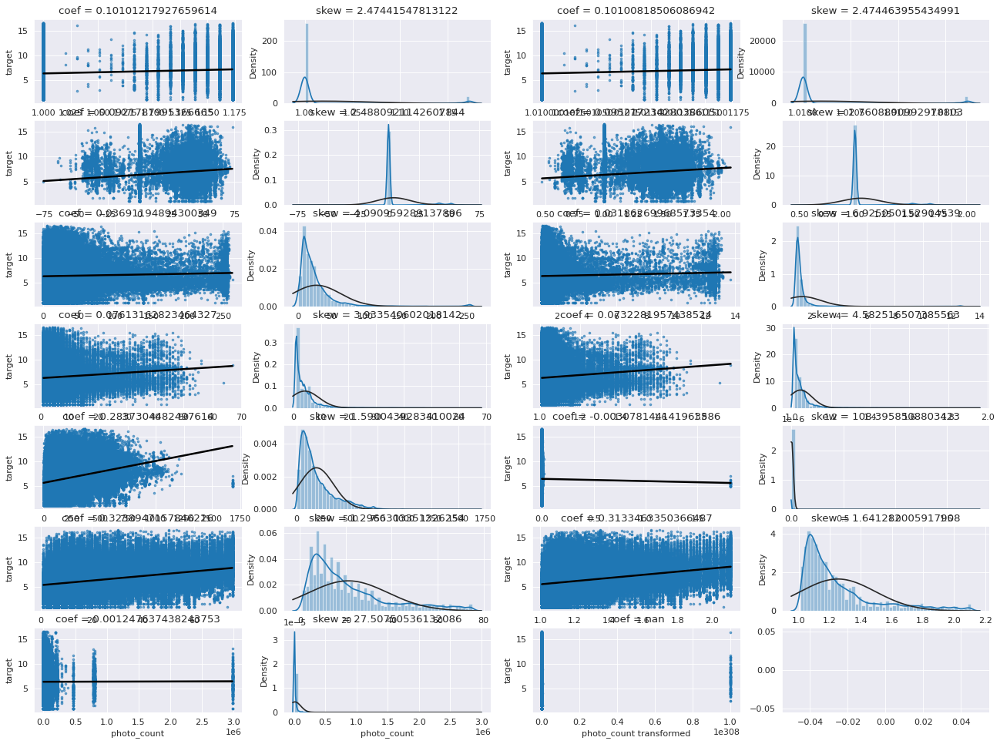

In [128]:
## 偏态数据前后可视化
plt.figure(figsize=(20,60),dpi=80)
import tqdm
i = 0
for col in tqdm(piantai):
    print(col)
    
    # 正态化之前的偏态特征与结果变量相关图与正态分布图
    i += 1
    plt.subplot(17,4,i)
    sns.regplot(x = col, y = 'label', data = train_fea,
               scatter_kws = {'marker': '.', 's': 5, 'alpha': .6},
               line_kws = {'color': 'k'})
    coef = np.corrcoef(train_fea[col], train_fea['label'])[0][1]
    plt.title(f'coef = {coef}')
    plt.xlabel(col)
    plt.ylabel('target')
    
    i += 1
    plt.subplot(17,4,i)
    sns.distplot(train_fea[col], fit = stats.norm)
    plt.title(f'skew = {stats.skew(train_fea[col])}')
    plt.xlabel(col)
    
    # 找到合适的底数，对dtrain的偏态特征进行对数转换
    sub = find_min_skew(dfull[col])[0]
    train_fea[col] = np.power(sub, train_fea[col])
    
    # 对数转换之后特征与结果变量相关图与正态分布图
    i += 1
    plt.subplot(17,4,i)
    sns.regplot(x = col, y = 'label', data = train_fea,
               scatter_kws = {'marker': '.', 's': 5, 'alpha': .6},
               line_kws = {'color': 'k'})
    coef = np.corrcoef(train_fea[col], train_fea['label'])[0][1]
    plt.title(f'coef = {coef}')
    plt.xlabel(col+' transformed')
    plt.ylabel('target')
    
    i += 1
    plt.subplot(17,4,i)
    sns.distplot(train_fea[col], fit = stats.norm)
    plt.title(f'skew = {stats.skew(train_fea[col])}')
    plt.xlabel(col+' transformed')
    
plt.tight_layout()

In [ ]:
## 对训练集、测试集同时进行偏态数据正则化
for col in piantai:
    sub = find_min_skew(dfull[col])[0]
    dfull[col] = np.power(sub, dfull[col])
dtrain, dtest = split_dfull()

In [ ]:
## 对剩余数据进行z-statistic标准化

dfull.iloc[:,:-1] = dfull.iloc[:,:-1].apply(lambda x: (x-x.mean())/x.std())
dtrain, dtest = split_dfull()

In [ ]:
## 查看特征化后的特征分布直方图
plt.figure(figsize=(20,20),dpi=80)
for i in range(22):
    plt.subplot(6,4,i+1)
    sns.distplot(dtrain.iloc[:,i], color='green')
    sns.distplot(dtest.iloc[:,i], color='red')
    plt.legend(['Train','Test'])
plt.tight_layout()

In [ ]:
## 模型训练

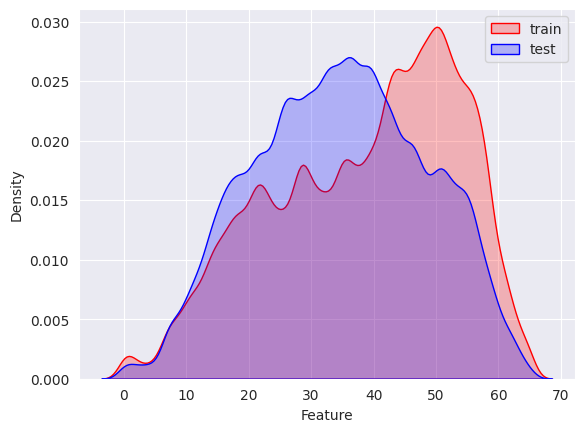

In [78]:
## KDE (核密度估计)分布图
# columns1 = ['Category', 'Uid', 'Subcategory','Mediatype', 'Longitude', 'Geoaccuracy', 'Latitude',
#          'Title_len', 'Title_number','Alltags_len','Alltags_number', 'hour', 'day','weekday','week_hour',
#           'year_weekday','photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
#           'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
#           'followingCount']
# columns1 = []
sns.kdeplot(train_fea['week_hour'], shade = True, color='r', label = 'train')
sns.kdeplot(test_fea['week_hour'], shade = True, color='b', label = 'test')
plt.xlabel('Feature')
plt.legend()
plt.show()

In [ ]:
bad_cols = []
for col in df_all.columns:
    rate_train = df_all[col].value_counts(normalize=True, dropna=False).values[0]
    if rate_train > 0.99:
        bad_cols.append(col)

df_all = df_all.drop(bad_cols, axis=1)

print('Data Shape: ', df_all.shape)
print(bad_cols)

In [75]:
## KS检验
# columns1 = ['Category', 'Uid', 'Subcategory','Mediatype', 'Longitude', 'Geoaccuracy', 'Latitude',
#          'Title_len', 'Title_number','Alltags_len','Alltags_number', 'hour', 'day','weekday','week_hour',
#           'year_weekday','photo_count', 'totalTags', 'totalGeotagged', 'totalFaves',
#           'totalInGroup','photoCount','meanView', 'meanTags', 'meanFaves', 'followerCount',
#           'followingCount']
from scipy import stats
stats.ks_2samp(train_fea['hour'], test_fea['hour'])
# 输出：KstestResult(statistic=0.2, pvalue=0.2719135601522248)

KstestResult(statistic=0.022153380568152657, pvalue=7.988385114272139e-49, statistic_location=3, statistic_sign=1)

In [76]:
from scipy import stats
stats.ks_2samp(train_fea['hour'], train_fea['hour'])

KstestResult(statistic=0.0, pvalue=1.0, statistic_location=0, statistic_sign=1)

In [ ]:
## 对抗验证

In [ ]:
## 元学习

In [ ]:
## 线性衰减